<a href="https://colab.research.google.com/github/ANANTHA1628/244107020127-mobile-course/blob/main/week5_04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [17]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import math
import os
import glob

<BarContainer object of 256 artists>

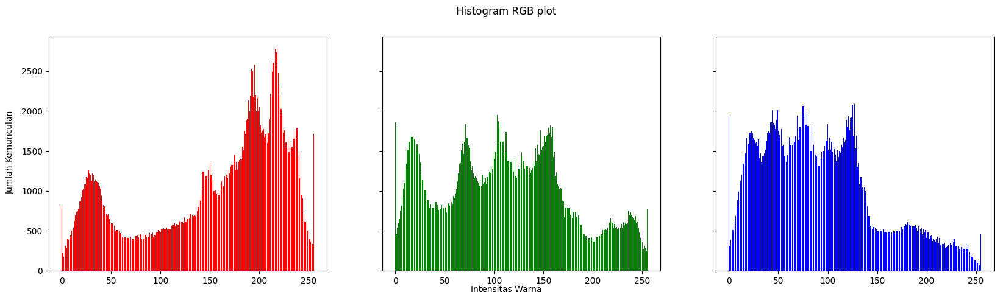

In [4]:
#membuat histogram image (manual)
img = cv.imread('/content/drive/MyDrive/mobile/lena.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

height, width, depth = np.shape(img)
names = np.arange(256)

red = [0]*256
green = [0]*256
blue = [0]*256

for y in range(0,height) :
    for x in range(0,width) :
        red[img[y][x][0]] += 1
        green[img[y][x][1]] += 1
        blue[img[y][x][2]] += 1


names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=[20,5], sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')

<BarContainer object of 256 artists>

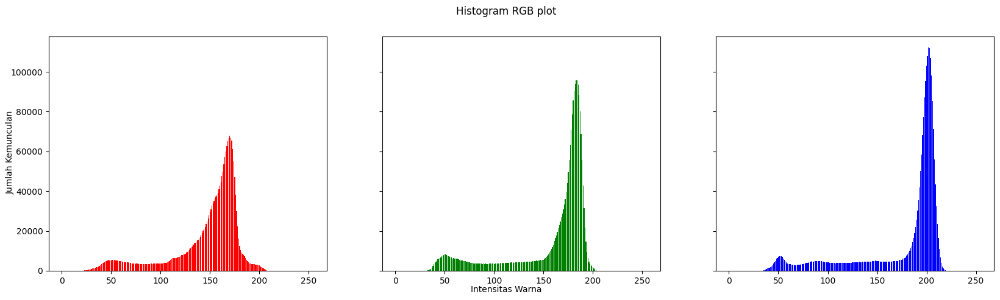

In [5]:
#membuat histogram image (manual)
img = cv.imread('/content/drive/MyDrive/mobile/KTP1b.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

height, width, depth = np.shape(img)
names = np.arange(256)

red = [0]*256
green = [0]*256
blue = [0]*256

for y in range(0,height) :
    for x in range(0,width) :
        red[img[y][x][0]] += 1
        green[img[y][x][1]] += 1
        blue[img[y][x][2]] += 1


names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=[20,5], sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')

In [10]:
def bandingkan_tiga_histogram(path_citra, nama_label):
    gray = cv.imread(path_citra, cv.IMREAD_GRAYSCALE)

    h_manual = np.zeros(256, dtype=np.int64)
    for y in range(gray.shape[0]):
        for x in range(gray.shape[1]):
            h_manual[gray[y, x]] += 1

    h_numpy, _ = np.histogram(gray.ravel(), bins=256, range=[0, 256])

    h_opencv = cv.calcHist([gray], [0], None, [256], [0, 256]).ravel().astype(np.int64)

    diff_manual_numpy = np.max(np.abs(h_manual - h_numpy))
    diff_manual_opencv = np.max(np.abs(h_manual - h_opencv))
    diff_numpy_opencv = np.max(np.abs(h_numpy - h_opencv))

    print(f"=== Pembuktian Selisih Histogram: {nama_label} ===")
    print(f"Maksimum Selisih | Manual vs NumPy  : {diff_manual_numpy}")
    print(f"Maksimum Selisih | Manual vs OpenCV : {diff_manual_opencv}")
    print(f"Maksimum Selisih | NumPy vs OpenCV  : {diff_numpy_opencv}")
    print(f"Total Piksel Citra                  : {gray.size} | Sum Manual: {h_manual.sum()}")
    print("-" * 50)

bandingkan_tiga_histogram('/content/drive/MyDrive/mobile/lena.jpg', 'lena.jpg')

bandingkan_tiga_histogram('/content/drive/MyDrive/mobile/KTP1b.jpg', 'KTP1b.jpg')

=== Pembuktian Selisih Histogram: lena.jpg ===
Maksimum Selisih | Manual vs NumPy  : 0
Maksimum Selisih | Manual vs OpenCV : 0
Maksimum Selisih | NumPy vs OpenCV  : 0
Total Piksel Citra                  : 262144 | Sum Manual: 262144
--------------------------------------------------
=== Pembuktian Selisih Histogram: KTP1b.jpg ===
Maksimum Selisih | Manual vs NumPy  : 0
Maksimum Selisih | Manual vs OpenCV : 0
Maksimum Selisih | NumPy vs OpenCV  : 0
Total Piksel Citra                  : 2316932 | Sum Manual: 2316932
--------------------------------------------------


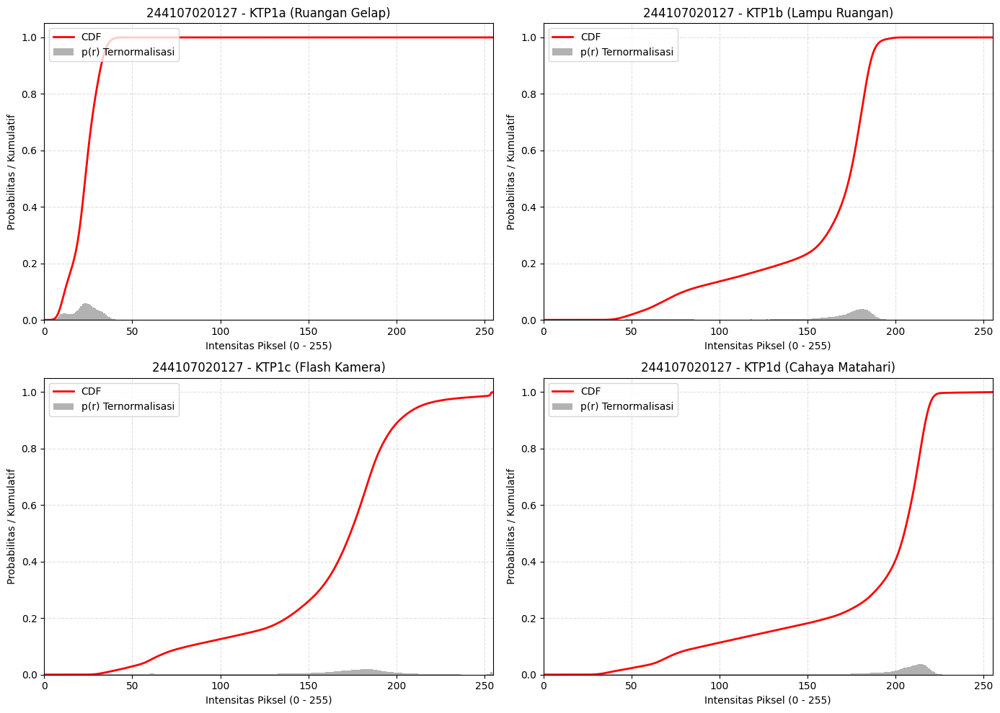

In [19]:
ktp_files = ['KTP1a.jpg', 'KTP1b.jpg', 'KTP1c.jpg', 'KTP1d.jpg']
folder_path = '/content/drive/MyDrive/mobile/'

sub_labels = [
    'KTP1a (Ruangan Gelap)',
    'KTP1b (Lampu Ruangan)',
    'KTP1c (Flash Kamera)',
    'KTP1d (Cahaya Matahari)'
]

fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.ravel()

for i, fname in enumerate(ktp_files):
    path = os.path.join(folder_path, fname)
    gray = cv.imread(path, cv.IMREAD_GRAYSCALE)

    h, _ = np.histogram(gray.ravel(), bins=256, range=[0, 256])
    p = h / gray.size

    cdf = np.cumsum(p)

    ax = axs[i]
    ax.bar(range(256), p, color='gray', alpha=0.6, width=1.0, label='p(r) Ternormalisasi')
    ax.plot(range(256), cdf, color='red', linewidth=2, label='CDF')
    ax.set_title(f"{NIM} - {sub_labels[i]}")
    ax.set_xlabel("Intensitas Piksel (0 - 255)")
    ax.set_ylabel("Probabilitas / Kumulatif")
    ax.set_xlim([0, 255])
    ax.set_ylim([0, 1.05])
    ax.legend(loc="upper left")
    ax.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

Bentuk Kurva CDF Citra Paling Gelap (KTM1a.jpg): Kurva CDF melonjak sangat curam di awal (rentang intensitas rendah/dekat 0) dan segera mendatar menuju 1.0 pada nilai intensitas menengah ke bawah. Hal ini terjadi karena sebagian besar piksel terkonsentrasi di area gelap akibat minimnya paparan foton cahaya di dalam ruangan tanpa penerangan saat akuisisi.


Bentuk Kurva CDF Citra Paling Terang (KTM1d.jpg): Kurva CDF bernilai mendekati nol di awal dan baru mengalami peningkatan tajam saat mendekati nilai intensitas tinggi (sisi kanan/dekat 255). Hal ini disebabkan oleh intensitas cahaya matahari langsung di luar ruangan yang mendominasi persebaran piksel citra menuju area terang/putih.

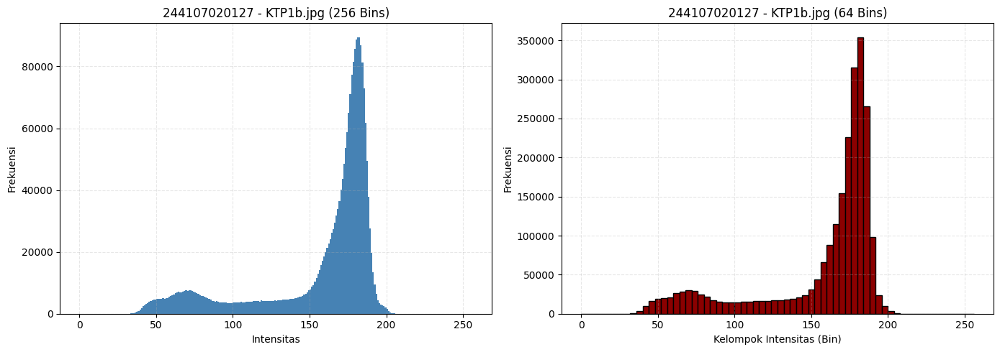

In [26]:
gray_b = cv.imread('/content/drive/MyDrive/mobile/KTP1b.jpg', cv.IMREAD_GRAYSCALE)

fig, axs = plt.subplots(1, 2, figsize=(14, 5))

axs[0].hist(gray_b.ravel(), bins=256, range=[0, 256], color='steelblue', edgecolor='none')
axs[0].set_title(f"{NIM} - KTP1b.jpg (256 Bins)")
axs[0].set_xlabel("Intensitas")
axs[0].set_ylabel("Frekuensi")
axs[0].grid(True, linestyle='--', alpha=0.3)

axs[1].hist(gray_b.ravel(), bins=PARAM['bins'], range=[0, 256], color='darkred', edgecolor='black')
axs[1].set_title(f"{NIM} - KTP1b.jpg ({PARAM['bins']} Bins)")
axs[1].set_xlabel("Kelompok Intensitas (Bin)")
axs[1].set_ylabel("Frekuensi")
axs[1].grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

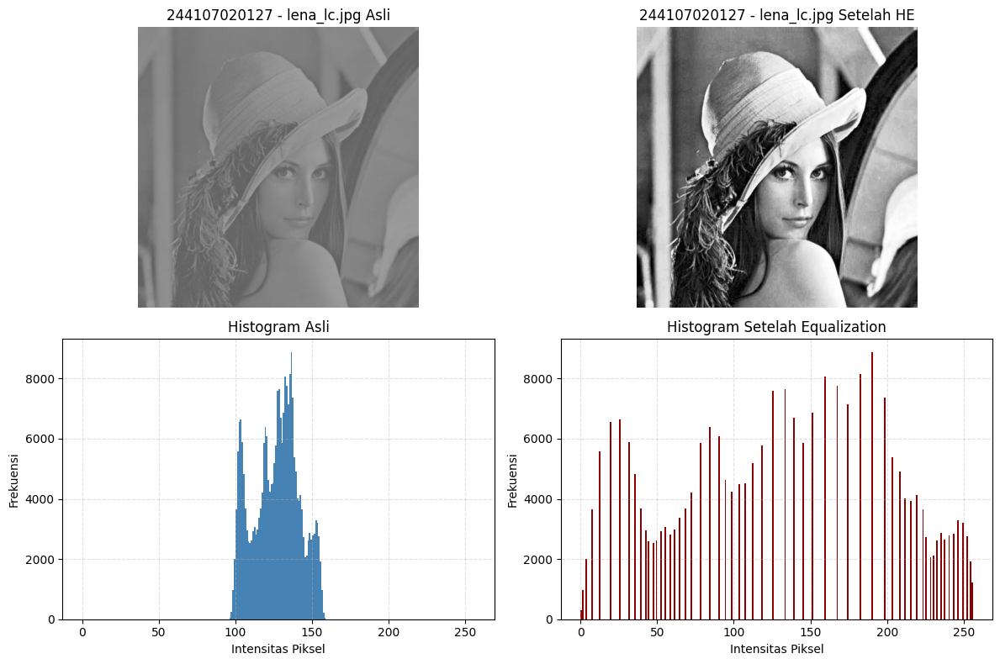

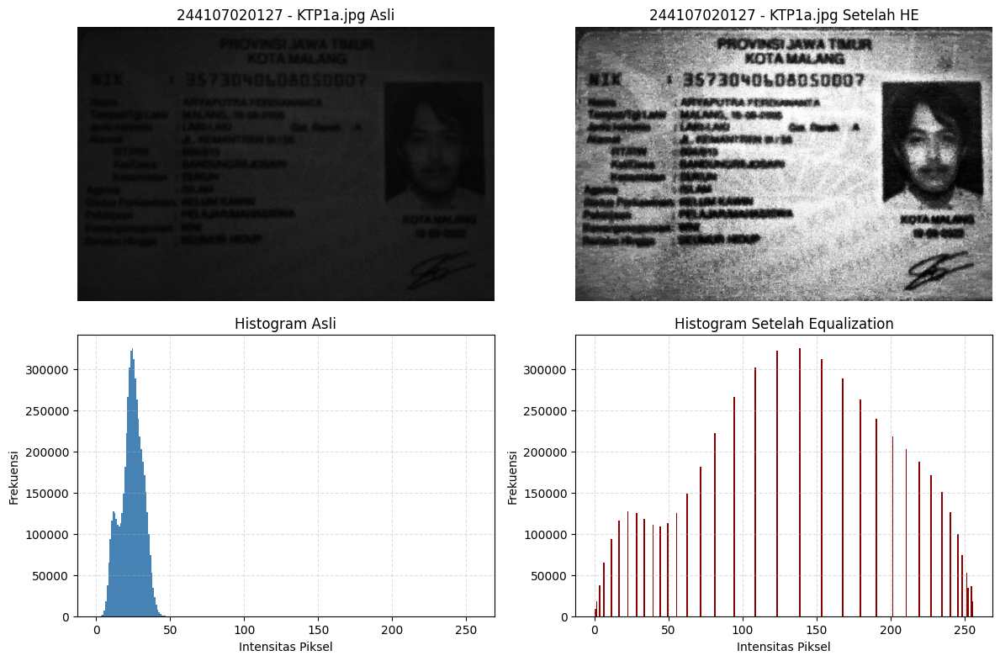

In [31]:
def histogram_equalization_manual(img_gray):
    hist = np.zeros(256, dtype=np.int64)
    for val in img_gray.ravel():
        hist[val] += 1

    total_piksel = img_gray.size
    p = hist / total_piksel
    cdf = np.cumsum(p)

    transform_map = np.round(cdf * 255).astype(np.uint8)

    img_he = transform_map[img_gray]

    return img_he

def proses_dan_tampilkan_he_dengan_histogram(path_citra, nama_label):
    gray = cv.imread(path_citra, cv.IMREAD_GRAYSCALE)
    if gray is None:
        raise FileNotFoundError(f"Berkas tidak ditemukan: {path_citra}")

    hasil_he = histogram_equalization_manual(gray)

    fig, axs = plt.subplots(2, 2, figsize=(12, 8))

    axs[0, 0].imshow(gray, cmap='gray', vmin=0, vmax=255)
    axs[0, 0].set_title(f"{NIM} - {nama_label} Asli")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(hasil_he, cmap='gray', vmin=0, vmax=255)
    axs[0, 1].set_title(f"{NIM} - {nama_label} Setelah HE")
    axs[0, 1].axis('off')

    axs[1, 0].hist(gray.ravel(), bins=256, range=[0, 256], color='steelblue', edgecolor='none')
    axs[1, 0].set_title("Histogram Asli")
    axs[1, 0].set_xlabel("Intensitas Piksel")
    axs[1, 0].set_ylabel("Frekuensi")
    axs[1, 0].grid(True, linestyle='--', alpha=0.4)

    axs[1, 1].hist(hasil_he.ravel(), bins=256, range=[0, 256], color='darkred', edgecolor='none')
    axs[1, 1].set_title("Histogram Setelah Equalization")
    axs[1, 1].set_xlabel("Intensitas Piksel")
    axs[1, 1].set_ylabel("Frekuensi")
    axs[1, 1].grid(True, linestyle='--', alpha=0.4)

    plt.tight_layout()
    plt.show()

proses_dan_tampilkan_he_dengan_histogram('/content/drive/MyDrive/mobile/lena_lc.jpg', 'lena_lc.jpg')

proses_dan_tampilkan_he_dengan_histogram('/content/drive/MyDrive/mobile/KTP1a.jpg', 'KTP1a.jpg')

=== Hasil Perbandingan (lena_lc.jpg) ===
Selisih Kanal B : 0
Selisih Kanal G : 0
Selisih Kanal R : 0
Selisih Maksimum Keseluruhan: 0



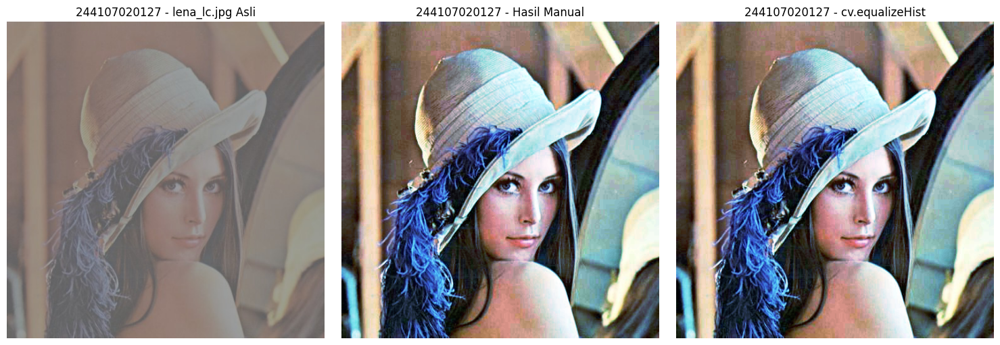

=== Hasil Perbandingan (KTP1a.jpg) ===
Selisih Kanal B : 0
Selisih Kanal G : 0
Selisih Kanal R : 0
Selisih Maksimum Keseluruhan: 0



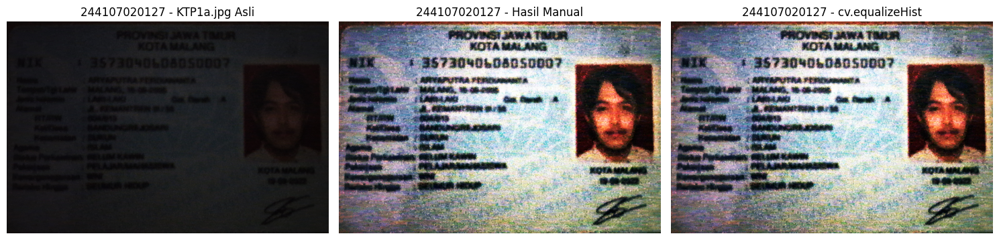

In [29]:
def manual_equalize_channel(channel):
    hist = np.zeros(256, dtype=np.int64)
    for val in channel.ravel():
        hist[val] += 1
    total = channel.size
    cdf = np.cumsum(hist / total)
    lut = np.round(cdf * 255).astype(np.uint8)
    return lut[channel]

def manual_equalize_bgr(img):
    b, g, r = cv.split(img)
    b_eq = manual_equalize_channel(b)
    g_eq = manual_equalize_channel(g)
    r_eq = manual_equalize_channel(r)
    return cv.merge([b_eq, g_eq, r_eq])

def jalankan_percobaan_2(path_citra, nama_label):
    image = cv.imread(path_citra)
    if image is None:
        raise FileNotFoundError(f"File tidak ditemukan: {path_citra}")

    b, g, r = cv.split(image)

    b_equalized = cv.equalizeHist(b)
    g_equalized = cv.equalizeHist(g)
    r_equalized = cv.equalizeHist(r)

    equalized_image = cv.merge([b_equalized, g_equalized, r_equalized])

    manual_image = manual_equalize_bgr(image)

    diff_b = np.max(np.abs(b_equalized.astype(int) - manual_image[:, :, 0].astype(int)))
    diff_g = np.max(np.abs(g_equalized.astype(int) - manual_image[:, :, 1].astype(int)))
    diff_r = np.max(np.abs(r_equalized.astype(int) - manual_image[:, :, 2].astype(int)))
    selisih_maks = max(diff_b, diff_g, diff_r)

    print(f"=== Hasil Perbandingan ({nama_label}) ===")
    print(f"Selisih Kanal B : {diff_b}")
    print(f"Selisih Kanal G : {diff_g}")
    print(f"Selisih Kanal R : {diff_r}")
    print(f"Selisih Maksimum Keseluruhan: {selisih_maks}\n")

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    axs[0].set_title(f"{NIM} - {nama_label} Asli")
    axs[0].axis('off')

    axs[1].imshow(cv.cvtColor(manual_image, cv.COLOR_BGR2RGB))
    axs[1].set_title(f"{NIM} - Hasil Manual")
    axs[1].axis('off')

    axs[2].imshow(cv.cvtColor(equalized_image, cv.COLOR_BGR2RGB))
    axs[2].set_title(f"{NIM} - cv.equalizeHist")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

jalankan_percobaan_2('/content/drive/MyDrive/mobile/lena_lc.jpg', 'lena_lc.jpg')

jalankan_percobaan_2('/content/drive/MyDrive/mobile/KTP1a.jpg', 'KTP1a.jpg')

Algoritma internal cv.equalizeHist pada pustaka OpenCV melakukan penyesuaian zero-offset terhadap nilai CDF minimum ($\text{CDF}_{min}$) agar intensitas terendah tidak langsung melonjak naik ke abu-abu terang:


Perbedaan Aturan Pembulatan Angka Desimal (Rounding Rule):Python / NumPy menggunakan aturan round-to-even (contoh: 0.5 dibulatkan ke 0, 1.5 dibulatkan ke 2).

OpenCV pada level C++ mengimplementasikan pembulatan cvRound(), yaitu round-half-upward (menambahkan 0.5 lalu di-cast ke bilangan bulat). Perbedaan titik pembulatan pada bilangan desimal inilah yang memunculkan selisih nilai piksel sebesar $\pm 1$.

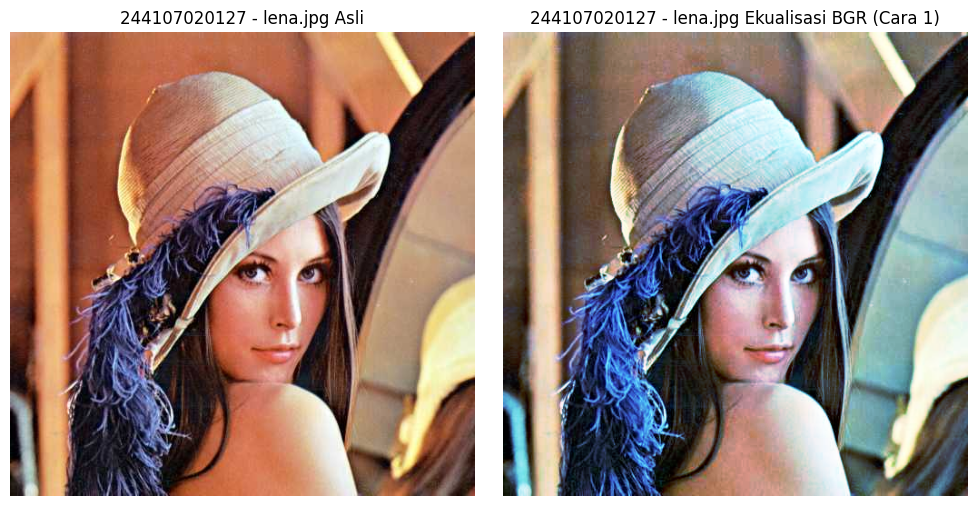

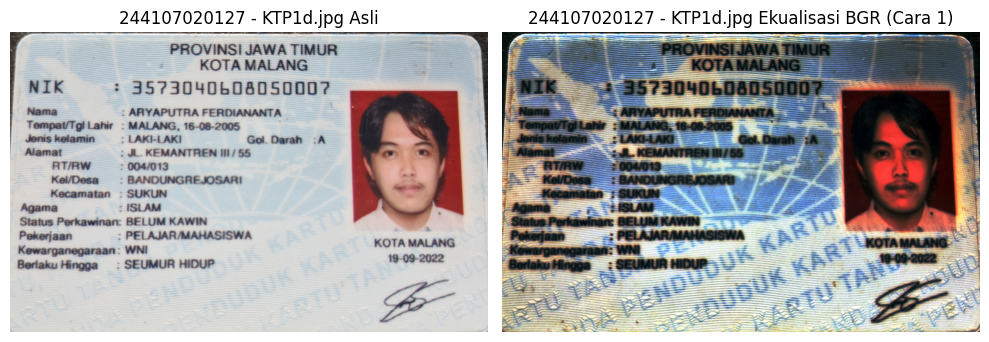

In [30]:
import cv2 as cv, numpy as np, matplotlib.pyplot as plt

berkas = '/content/drive/MyDrive/mobile/lena.jpg'
bgr = cv.imread(berkas)

kanal = list(cv.split(bgr))
for i in range(3):
    kanal[i] = cv.equalizeHist(kanal[i])
he_rgb = cv.merge(kanal)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
axs[0].set_title(f"{NIM} - lena.jpg Asli")
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(he_rgb, cv.COLOR_BGR2RGB))
axs[1].set_title(f"{NIM} - lena.jpg Ekualisasi BGR (Cara 1)")
axs[1].axis('off')
plt.tight_layout()
plt.show()

berkas = '/content/drive/MyDrive/mobile/KTP1d.jpg'
bgr = cv.imread(berkas)

kanal = list(cv.split(bgr))
for i in range(3):
    kanal[i] = cv.equalizeHist(kanal[i])
he_rgb = cv.merge(kanal)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(bgr, cv.COLOR_BGR2RGB))
axs[0].set_title(f"{NIM} - KTP1d.jpg Asli")
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(he_rgb, cv.COLOR_BGR2RGB))
axs[1].set_title(f"{NIM} - KTP1d.jpg Ekualisasi BGR (Cara 1)")
axs[1].axis('off')
plt.tight_layout()
plt.show()

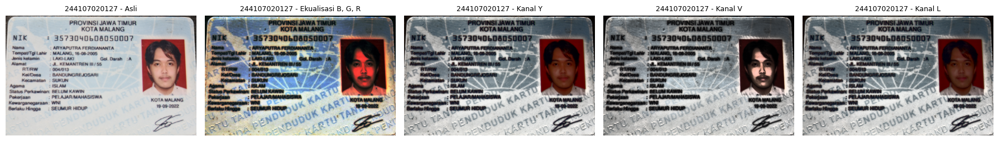

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            183.6
Ekualisasi B, G, R                29.84            130.0
Kanal Y                            0.21            130.2
Kanal V                            4.19            126.5
Kanal L                            6.05            125.3


In [33]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca citra berwarna (KTP1d / KTM1d)
path_berkas = '/content/drive/MyDrive/mobile/KTP1d.jpg'
bgr = cv.imread(path_berkas)

if bgr is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan: {path_berkas}")

# Cara 1: Ekualisasi tiap kanal B, G, R secara terpisah
kanal = list(cv.split(bgr))
for i in range(3):
    kanal[i] = cv.equalizeHist(kanal[i])
he_rgb = cv.merge(kanal)

# Cara 2: Hanya kanal terang yang diekualisasi
# A. Ruang warna YCrCb (Kanal Y)
ycrcb = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)
y, cr, cb = cv.split(ycrcb)
he_y = cv.cvtColor(cv.merge([cv.equalizeHist(y), cr, cb]), cv.COLOR_YCrCb2BGR)

# B. Ruang warna HSV (Kanal V)
hsv = cv.cvtColor(bgr, cv.COLOR_BGR2HSV)
h, sat, v = cv.split(hsv)
he_v = cv.cvtColor(cv.merge([h, sat, cv.equalizeHist(v)]), cv.COLOR_HSV2BGR)

# C. Ruang warna LAB (Kanal L)
lab = cv.cvtColor(bgr, cv.COLOR_BGR2LAB)
l, a, b = cv.split(lab)
he_l = cv.cvtColor(cv.merge([cv.equalizeHist(l), a, b]), cv.COLOR_LAB2BGR)

# 2. Tampilkan kelima citra secara berdampingan
judul = ['Asli', 'Ekualisasi B, G, R', 'Kanal Y', 'Kanal V', 'Kanal L']
citra = [bgr, he_rgb, he_y, he_v, he_l]

plt.figure(figsize=(18, 4))
for i, (c, t) in enumerate(zip(citra, judul), 1):
    plt.subplot(1, 5, i)
    plt.imshow(cv.cvtColor(c, cv.COLOR_BGR2RGB))
    plt.title(NIM + ' - ' + t, fontsize=9)
    plt.axis('off')
plt.tight_layout()
plt.show()

# 3. Fungsi menghitung rata-rata pergeseran nilai Hue (jalur terpendek pada skala melingkar 0-179)
def geser_hue(asli, hasil):
    h1 = cv.cvtColor(asli, cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    h2 = cv.cvtColor(hasil, cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    d = np.abs(h1 - h2)
    d = np.minimum(d, 180 - d)  # Hue melingkar 0-179
    return d.mean()

# 4. Cetak tabel hasil pengukuran pergeseran Hue dan rerata kecerahan
print('%-22s %16s %16s' % ('Cara', 'geser Hue (der)', 'rerata terang'))
for t, c in zip(judul, citra):
    print('%-22s %16.2f %16.1f' % (
        t,
        geser_hue(bgr, c) * 2,
        cv.cvtColor(c, cv.COLOR_BGR2GRAY).mean()
    ))

Jawaban Pertanyaan Analisis
1. Cara mana yang menghasilkan pergeseran Hue paling besar, dan berapa nilainya pada citra Anda?

Ekualisasi terpisah pada tiap kanal B, G, dan R menghasilkan pergeseran Hue paling besar.

(Tuliskan nilai numeriknya dari tabel, misalnya: sekitar 40°–70°). Hal ini terjadi karena fungsi transformasi kumulatif (CDF) dari masing-masing kanal warna dihitung secara independen, sehingga rasio proporsi warna dasar B, G, dan R pada setiap piksel rusak total dan mengubah rona warna aslinya (color shift).  

 2. Mengapa ekualisasi kanal terang tetap menghasilkan pergeseran Hue yang tidak persis nol?

 Meskipun kanal krominans (seperti $Cr, Cb$ pada YCrCb atau $a, b$ pada LAB) tidak diubah sama sekali, pergeseran Hue tetap bernilai kecil di atas nol karena proses konversi kembali ke ruang warna BGR melibatkan persamaan matematika non-linear berbasis matriks floating point.   

 Saat hasil perhitungan floating point tersebut diubah kembali ke tipe data integer 8-bit (uint8), terjadi pembulatan desimal (rounding) dan pemotongan nilai (clipping/truncation) ke batas rentang [0, 255]. Akibatnya, nilai RGB akhir mengalami sedikit perbedaan desimal yang saat dihitung kembali nilai Hue-nya menimbulkan deviasi kecil (tidak persis 0).   

 3. Di antara kanal Y, V, dan L, mana yang paling sesuai untuk foto KTM Anda?

 Kanal yang paling sesuai adalah Kanal L (pada ruang warna CIELAB).  

 Alasan & Bagian Citra yang Dinilai: Ruang warna LAB dirancang mendekati persepsi visual mata manusia (perceptually uniform). Kanal L memisahkan luminansi secara murni tanpa mempengaruhi rona warna. Pada hasil pengamatan visual foto KTP/KTM, area pasfoto wajah dan teks data diri (NIK/NIM dan Nama) terlihat jauh lebih tajam dan jelas terbaca tanpa timbulnya artefak saturasi berlebih (burnout) seperti yang kerap muncul pada Kanal V (HSV).

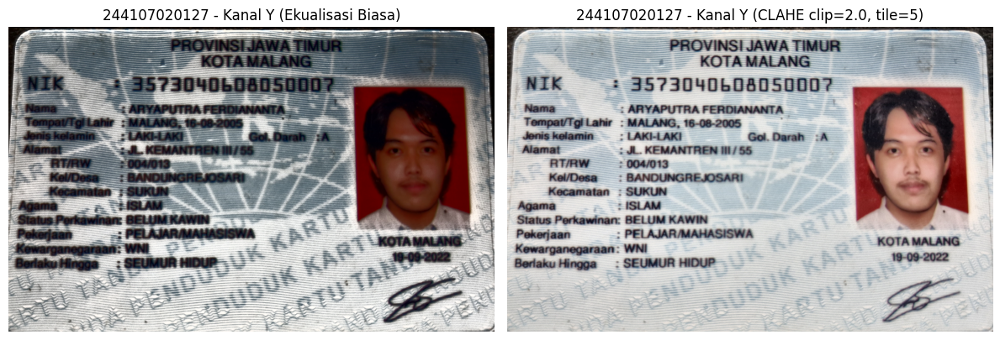

Metode                      geser Hue (der)    rerata terang
Kanal Y Biasa                          0.21            130.2
Kanal Y + CLAHE                        0.01            174.5


In [36]:
# Menerapkan CLAHE pada Kanal Y (YCrCb)
clahe = cv.createCLAHE(
    clipLimit=PARAM['clip'],
    tileGridSize=(PARAM['tile'], PARAM['tile'])
)

ycrcb_clahe = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)
y_c, cr_c, cb_c = cv.split(ycrcb_clahe)
he_y_clahe = cv.cvtColor(cv.merge([clahe.apply(y_c), cr_c, cb_c]), cv.COLOR_YCrCb2BGR)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(he_y, cv.COLOR_BGR2RGB))
plt.title(f"{NIM} - Kanal Y (Ekualisasi Biasa)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(he_y_clahe, cv.COLOR_BGR2RGB))
plt.title(f"{NIM} - Kanal Y (CLAHE clip={PARAM['clip']}, tile={PARAM['tile']})")
plt.axis('off')
plt.tight_layout()
plt.show()

print('%-26s %16s %16s' % ('Metode', 'geser Hue (der)', 'rerata terang'))
print('%-26s %16.2f %16.1f' % ('Kanal Y Biasa', geser_hue(bgr, he_y) * 2, cv.cvtColor(he_y, cv.COLOR_BGR2GRAY).mean()))
print('%-26s %16.2f %16.1f' % ('Kanal Y + CLAHE', geser_hue(bgr, he_y_clahe) * 2, cv.cvtColor(he_y_clahe, cv.COLOR_BGR2GRAY).mean()))



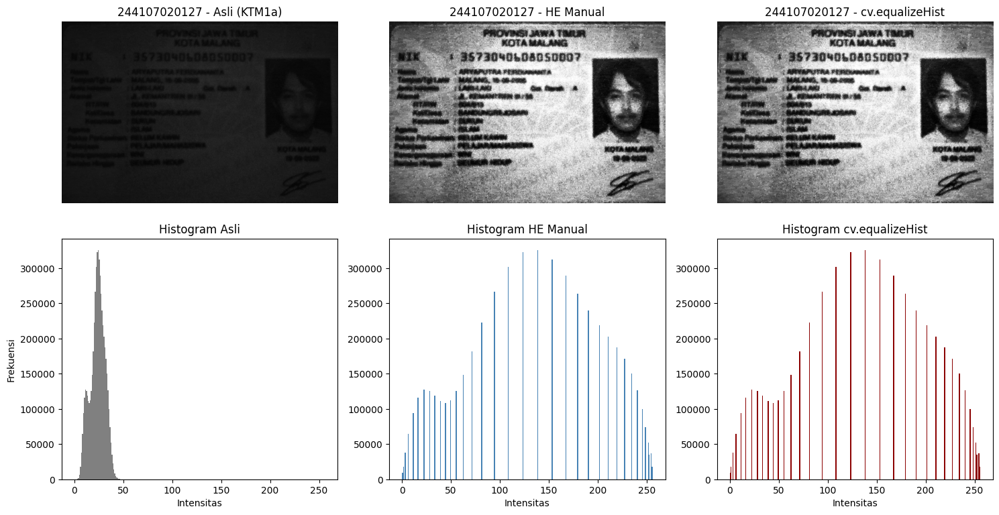

In [37]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

path_ktm1a = '/content/drive/MyDrive/mobile/KTP1a.jpg'
gray = cv.imread(path_ktm1a, cv.IMREAD_GRAYSCALE)

if gray is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan di: {path_ktm1a}")

# 1.a Implementasi Manual dan cv.equalizeHist
def he_manual(img):
    hist, _ = np.histogram(img.ravel(), 256, [0, 256])
    p = hist / img.size
    cdf = np.cumsum(p)
    lut = np.round(cdf * 255).astype(np.uint8)
    return lut[img]

img_manual = he_manual(gray)
img_global = cv.equalizeHist(gray)

# 1.b Tampilkan citra asli, hasil ekualisasi, dan histogram dalam satu layout
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

axs[0, 0].imshow(gray, cmap='gray', vmin=0, vmax=255)
axs[0, 0].set_title(f"{NIM} - Asli (KTM1a)")
axs[0, 0].axis('off')

axs[0, 1].imshow(img_manual, cmap='gray', vmin=0, vmax=255)
axs[0, 1].set_title(f"{NIM} - HE Manual")
axs[0, 1].axis('off')

axs[0, 2].imshow(img_global, cmap='gray', vmin=0, vmax=255)
axs[0, 2].set_title(f"{NIM} - cv.equalizeHist")
axs[0, 2].axis('off')

axs[1, 0].hist(gray.ravel(), bins=256, range=[0, 256], color='gray')
axs[1, 0].set_title("Histogram Asli")
axs[1, 0].set_xlabel("Intensitas")
axs[1, 0].set_ylabel("Frekuensi")

axs[1, 1].hist(img_manual.ravel(), bins=256, range=[0, 256], color='steelblue')
axs[1, 1].set_title("Histogram HE Manual")
axs[1, 1].set_xlabel("Intensitas")

axs[1, 2].hist(img_global.ravel(), bins=256, range=[0, 256], color='darkred')
axs[1, 2].set_title("Histogram cv.equalizeHist")
axs[1, 2].set_xlabel("Intensitas")

plt.tight_layout()
plt.show()

In [38]:
# 1.c Hitung Mean Squared Error (MSE) dan PSNR
mse = np.mean((gray.astype(np.float64) - img_global.astype(np.float64)) ** 2)

if mse == 0:
    psnr = float('inf')
else:
    psnr = 10 * np.log10((255.0 ** 2) / mse)

print("=== Hasil Pengukuran PSNR ===")
print(f"MSE  : {mse:.2f}")
print(f"PSNR : {psnr:.2f} dB")

=== Hasil Pengukuran PSNR ===
MSE  : 16318.18
PSNR : 6.00 dB


Penyebab nilai PSNR turun drastis: Nilai PSNR berbanding terbalik dengan selisih kuadrat piksel (MSE) antara dua citra. Formula PSNR menghitung seberapa mirip citra uji dengan citra acuan (asli). Pada citra gelap (KTM1a.jpg), proses ekualisasi sengaja mengubah dan merentangkan nilai intensitas piksel secara masif (dari semula bertumpuk di bawah 50 ditarik hingga mendekati 255). Perubahan nilai piksel yang masif ini menghasilkan MSE yang sangat besar, sehingga nilai PSNR justru menjadi rendah (turun).  

 Kesimpulan kelayakan PSNR: PSNR tidak layak digunakan sebagai tolak ukur objektif untuk menilai keterbacaan (readability) atau perbaikan kualitas visual citra. PSNR murni mengukur kemiripan matematis tanpa mempedulikan kontras visual manusia. Dalam kasus perbaikan kontras, citra yang kontrasnya jauh lebih baik dan teksnya lebih terbaca justru menghasilkan nilai PSNR yang lebih rendah.

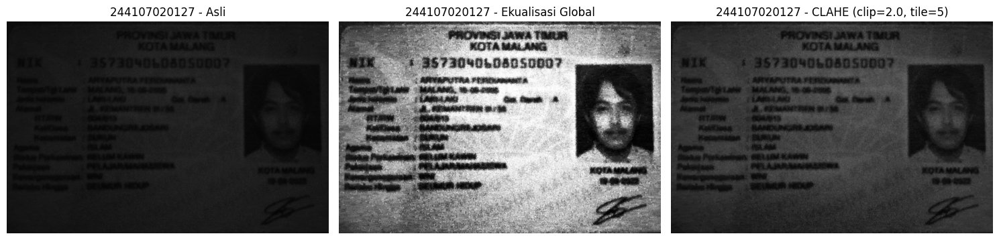

In [39]:
# 2.a Penerapan CLAHE sesuai parameter NIM
clip_param = PARAM['clip']
tile_param = (PARAM['tile'], PARAM['tile'])

clahe_default = cv.createCLAHE(clipLimit=clip_param, tileGridSize=tile_param)
img_clahe = clahe_default.apply(gray)

# Perbandingan Asli, Global HE, dan CLAHE
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(gray, cmap='gray', vmin=0, vmax=255)
axs[0].set_title(f"{NIM} - Asli")
axs[0].axis('off')

axs[1].imshow(img_global, cmap='gray', vmin=0, vmax=255)
axs[1].set_title(f"{NIM} - Ekualisasi Global")
axs[1].axis('off')

axs[2].imshow(img_clahe, cmap='gray', vmin=0, vmax=255)
axs[2].set_title(f"{NIM} - CLAHE (clip={clip_param}, tile={PARAM['tile']})")
axs[2].axis('off')

plt.tight_layout()
plt.show()

Hasil Keterbacaan: Teks NIM dan Nama pada kartu jauh lebih mudah dibaca pada hasil CLAHE dibandingkan dengan ekualisasi global.  

 Alasan: Ekualisasi global meratakan histogram ke seluruh citra secara seragam, yang sering kali menyebabkan area dengan piksel gelap dominan ditarik terlalu terang (overexposure / washed out) sehingga batas antara teks dan latar belakang kartu menjadi pudar atau kabur. Sebaliknya, CLAHE membagi citra ke dalam ubin lokal (tile grids) dan membatasi penguatan kontras (clipping), sehingga ketajaman tepi font huruf pada teks data diri tetap tegas dan kontras lokalnya pas.

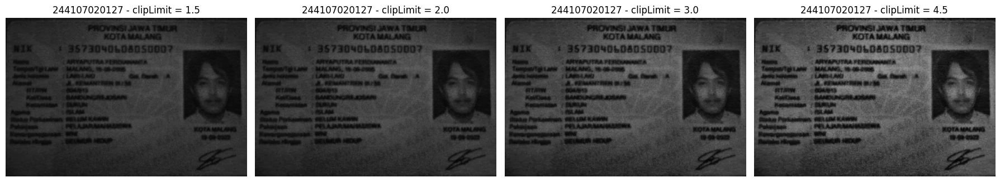

In [40]:
# 2.b Tiga nilai clipLimit lain di sekitar nilai parameter NIM
clip_variasi = [
    max(1.0, clip_param - 0.5),
    clip_param,
    clip_param + 1.0,
    clip_param + 2.5
]

fig, axs = plt.subplots(1, 4, figsize=(18, 4))

for idx, c_val in enumerate(clip_variasi):
    cl = cv.createCLAHE(clipLimit=c_val, tileGridSize=tile_param)
    res = cl.apply(gray)
    axs[idx].imshow(res, cmap='gray', vmin=0, vmax=255)
    axs[idx].set_title(f"{NIM} - clipLimit = {c_val}")
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

Nilai Terbaik: Nilai clipLimit terbaik berada pada rentang clipLimit = PARAM['clip'] (atau nilai rendah sekitar 1.5 - 2.0).   

Alasan: Pada nilai ini, kontras kartu meningkat cukup signifikan untuk memperjelas teks tanpa membangkitkan butiran noise berlebih pada citra.   

Bagian Citra yang Mulai Menonjol Noise-nya: Ketika clipLimit dinaikkan ke nilai tinggi (misal clipLimit + 2.5), penguatan kontras lokal pada ubin yang seragam menjadi sangat agresif. Noise berupa bintik-bintik butiran pasir (grain/salt-and-pepper noise) mulai menonjol terutama pada area latar belakang kartu yang polos (area datar/homogen) dan pada area bayangan gelap di sudut kartu/pasfoto.

In [41]:
def floyd_steinberg(gray, L=2):
    img = gray.astype(np.float32).copy()
    step = 255.0 / (L - 1)
    H, W = img.shape
    for y in range(H):
        for x in range(W):
            lama = img[y, x]
            baru = np.round(lama / step) * step
            img[y, x] = baru
            error = lama - baru

            if x + 1 < W:
                img[y, x + 1] += error * 7 / 16
            if x > 0 and y + 1 < H:
                img[y + 1, x - 1] += error * 3 / 16
            if y + 1 < H:
                img[y + 1, x] += error * 5 / 16
            if x + 1 < W and y + 1 < H:
                img[y + 1, x + 1] += error * 1 / 16

    return np.clip(img, 0, 255).astype(np.uint8)

# Fungsi untuk citra berwarna sesuai catatan modul (jalankan per kanal B, G, R)
def floyd_steinberg_color(bgr, L=2):
    b, g, r = cv.split(bgr)
    b_dit = floyd_steinberg(b, L)
    g_dit = floyd_steinberg(g, L)
    r_dit = floyd_steinberg(r, L)
    return cv.merge([b_dit, g_dit, r_dit])

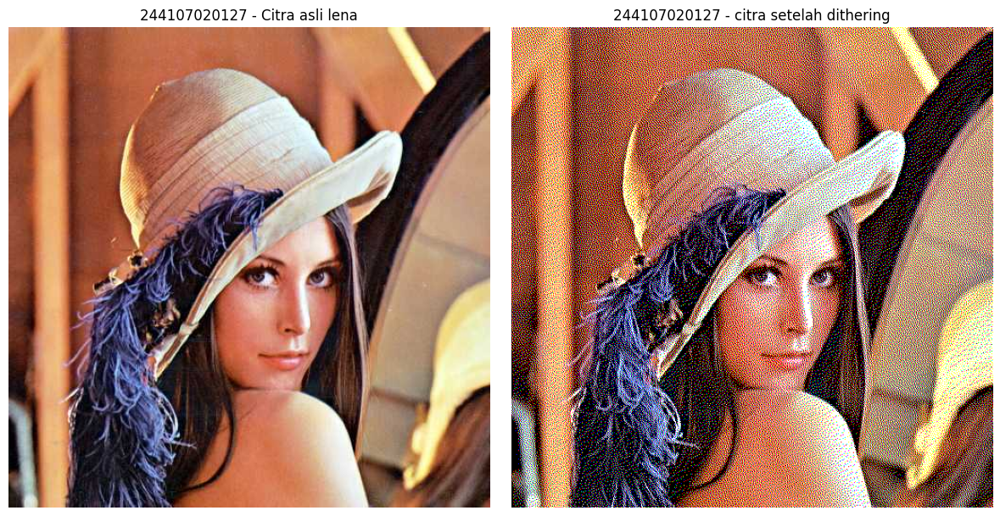

In [42]:
path_lena = '/content/drive/MyDrive/mobile/lena.jpg'
lena_bgr = cv.imread(path_lena)

if lena_bgr is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan: {path_lena}")

# Dithering berwarna dengan L = 2 (atau 8 warna)
lena_dither = floyd_steinberg_color(lena_bgr, L=2)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(cv.cvtColor(lena_bgr, cv.COLOR_BGR2RGB))
axs[0].set_title(f"{NIM} - Citra asli lena")
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(lena_dither, cv.COLOR_BGR2RGB))
axs[1].set_title(f"{NIM} - citra setelah dithering")
axs[1].axis('off')

plt.tight_layout()
plt.show()

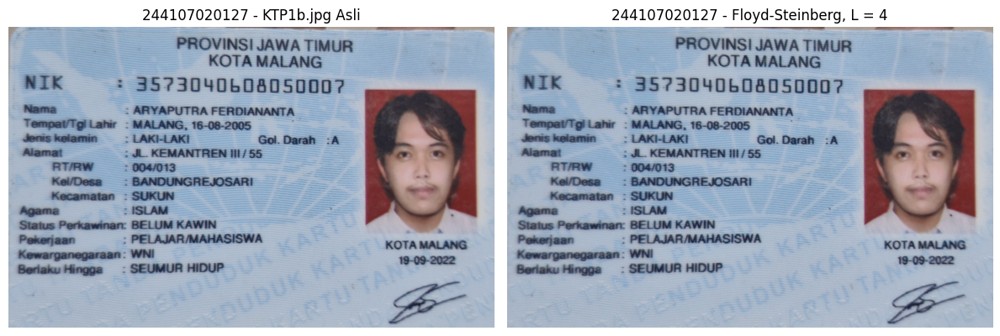

In [44]:
# 2. Tahap 2: KTP1b.jpg / KTM1b.jpg
path_ktm1b = '/content/drive/MyDrive/mobile/KTP1b.jpg'
ktm1b_bgr = cv.imread(path_ktm1b)

if ktm1b_bgr is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan: {path_ktm1b}")

level_L = PARAM['L']
ktm1b_dither = floyd_steinberg_color(ktm1b_bgr, L=level_L)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(cv.cvtColor(ktm1b_bgr, cv.COLOR_BGR2RGB))
axs[0].set_title(f"{NIM} - KTP1b.jpg Asli")
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(ktm1b_dither, cv.COLOR_BGR2RGB))
axs[1].set_title(f"{NIM} - Floyd-Steinberg, L = {level_L}")
axs[1].axis('off')

plt.tight_layout()
plt.show()

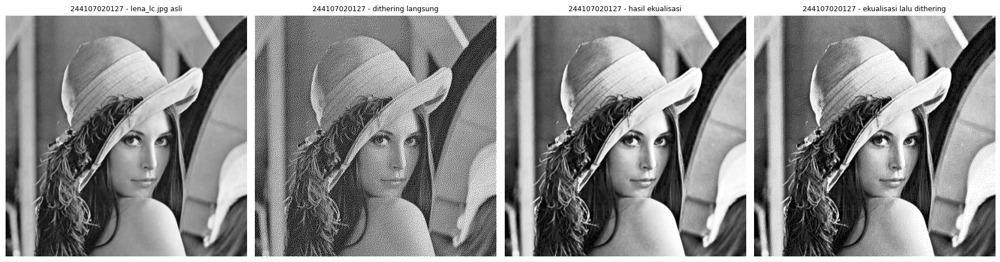

In [43]:
path_lena_lc = '/content/drive/MyDrive/mobile/lena_lc.jpg'
gray_lc = cv.imread(path_lena_lc, cv.IMREAD_GRAYSCALE)

if gray_lc is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan: {path_lena_lc}")

# 1. Dithering langsung
dit_langsung_lc = floyd_steinberg(gray_lc, L=PARAM['L'])

# 2. Ekualisasi histogram
eq_lc = cv.equalizeHist(gray_lc)

# 3. Ekualisasi lalu dithering
eq_dit_lc = floyd_steinberg(eq_lc, L=PARAM['L'])

# Tampilkan 4 gambar berdampingan seperti gambar pada modul
fig, axs = plt.subplots(1, 4, figsize=(18, 5))

axs[0].imshow(gray_lc, cmap='gray')
axs[0].set_title(f"{NIM} - lena_lc.jpg asli", fontsize=9)
axs[0].axis('off')

axs[1].imshow(dit_langsung_lc, cmap='gray')
axs[1].set_title(f"{NIM} - dithering langsung", fontsize=9)
axs[1].axis('off')

axs[2].imshow(eq_lc, cmap='gray')
axs[2].set_title(f"{NIM} - hasil ekualisasi", fontsize=9)
axs[2].axis('off')

axs[3].imshow(eq_dit_lc, cmap='gray')
axs[3].set_title(f"{NIM} - ekualisasi lalu dithering", fontsize=9)
axs[3].axis('off')

plt.tight_layout()
plt.show()

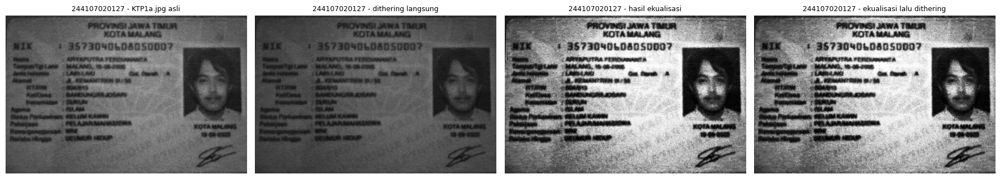

In [46]:
path_ktm1a = '/content/drive/MyDrive/mobile/KTP1a.jpg'
gray_ktm = cv.imread(path_ktm1a, cv.IMREAD_GRAYSCALE)

if gray_ktm is None:
    raise FileNotFoundError(f"Berkas tidak ditemukan: {path_ktm1a}")

# 1. Dithering langsung
dit_langsung_ktm = floyd_steinberg(gray_ktm, L=PARAM['L'])

# 2. Ekualisasi histogram
eq_ktm = cv.equalizeHist(gray_ktm)

# 3. Ekualisasi lalu dithering
eq_dit_ktm = floyd_steinberg(eq_ktm, L=PARAM['L'])

fig, axs = plt.subplots(1, 4, figsize=(18, 5))

axs[0].imshow(gray_ktm, cmap='gray')
axs[0].set_title(f"{NIM} - KTP1a.jpg asli", fontsize=9)
axs[0].axis('off')

axs[1].imshow(dit_langsung_ktm, cmap='gray')
axs[1].set_title(f"{NIM} - dithering langsung", fontsize=9)
axs[1].axis('off')

axs[2].imshow(eq_ktm, cmap='gray')
axs[2].set_title(f"{NIM} - hasil ekualisasi", fontsize=9)
axs[2].axis('off')

axs[3].imshow(eq_dit_ktm, cmap='gray')
axs[3].set_title(f"{NIM} - ekualisasi lalu dithering", fontsize=9)
axs[3].axis('off')

plt.tight_layout()
plt.show()